<a href="https://colab.research.google.com/github/deepali0162/Coursera_Capstone/blob/main/Capstone_Project_The_Battle_of_Neighborhoods.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

March *2021*

---

*Deepali Sharma*

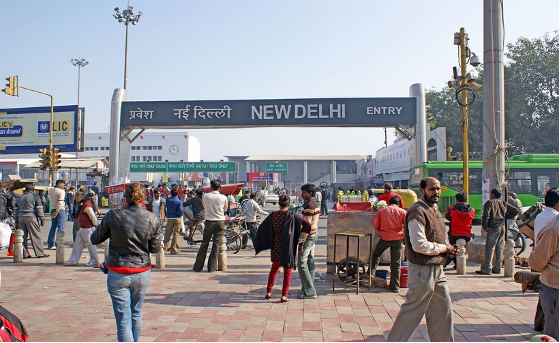

# **Capstone Project - The Battle of Neighbourhoods**

### **Introduction**

New Delhi is the national capital of India. It has a population of 257,803 and is the largest commercial city in Northern India. 
New Delhi is a cosmopolitan city due to the multi-ethnic and multi-cultural presence of the vast Indian bureaucracy and political system. The city's capital status has amplified the importance of national events and holidays. The city is already among the world's fastest changing cities, with an ability to embrace technological change, and deal with rapid population growth while strengthening global connectivity.
Traditionally speaking, a mixture of ancient Indian and Mughal styled cuisine is now considered as authentic Delhi cuisine. Street foods make a major part of the cuisine of the land. Top street food of Delhi is lassi, kebab, chole bhature, jalebis, falooda, samosa, butter chicken, Nihari, kulfi, and others.


### **Data**

For this project, we need the following data :
*   List of New Delhi restaurants
*   Locality
*   Longitude
*   Ratings

Description : The dataset contains the required information and we will use this dataset to explore various restaurants located in various parts of New Delhi.


### **Approach**

Collect the Zomato Kaggle dataset for India and extracting data for New Delhi.
Using FourSquare API, we will find all venues/restaurants for each locality.
Filter out the restaurants that are nearby locality.
Use Aggregate Rating for restaurant to find the best and worst place to eat.
Visualize the Ranking of localities using folium library in Python.


*Import* *libraries*

In [ ]:
from geopy.geocoders import Nominatim 
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

from bs4 import BeautifulSoup
import requests, os, string

print('Libraries imported.')

Libraries imported.


### The Dataset contains list of restaurants for different states of India. We will be working on the restaurants located in New Delhi.Using Locality we use can find out the restaurants.

*Tranform the data into a pandas dataframe*

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/haanjiankur/Capstone-Project---The-Battle-of-Neighborhoods/master/zomato.csv',encoding='ISO-8859-1')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
df_india = df[df['Country Code'] == 1]
df_NDLS = df_india[df_india['City'] == 'New Delhi']
df_NDLS.reset_index(drop=True, inplace=True)
df_NDLS.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,18287358,Food Cloud,1,New Delhi,"Aaya Nagar, New Delhi",Aaya Nagar,"Aaya Nagar, New Delhi",0.000000,0.000000,Cuisine Varies,500,Indian Rupees(Rs.),No,No,No,No,2,0.0,White,Not rated,2
1,18216944,Burger.in,1,New Delhi,"84, Near Honda Showroom, Adchini, New Delhi",Adchini,"Adchini, New Delhi",77.196923,28.535382,Fast Food,350,Indian Rupees(Rs.),No,Yes,No,No,1,3.2,Orange,Average,46
2,313333,Days of the Raj,1,New Delhi,"81/3, 1st Floor, Qutub Residency, Adchini, New...",Adchini,"Adchini, New Delhi",77.197475,28.535493,"North Indian, Seafood, Continental",1500,Indian Rupees(Rs.),Yes,Yes,No,No,3,3.4,Orange,Average,45
3,18384127,Dilli Ka Dhaba,1,New Delhi,"66 A, Ground Floor, Sri Aurobindo Marg, Adchin...",Adchini,"Adchini, New Delhi",77.198033,28.537547,"South Indian, North Indian",500,Indian Rupees(Rs.),No,No,No,No,2,2.6,Orange,Average,11
4,582,Govardhan,1,New Delhi,"84, Adjacent Hero Motor Bike Showroom, Main Me...",Adchini,"Adchini, New Delhi",77.196924,28.535523,"South Indian, North Indian, Chinese",500,Indian Rupees(Rs.),No,Yes,No,No,2,3.4,Orange,Average,238


### Data Cleaning

In [ ]:
#remove the unwanted columns and rows from dataset
df_Res= df_NDLS[df_NDLS.Longitude !=0.000000][['Restaurant Name','Locality','Longitude','Latitude','Cuisines','Aggregate rating','Rating text','Votes']]

In [ ]:
df_Res = df_Res[df_Res['Aggregate rating'] !=0.0]
df_Res.head()

,Restaurant Name,Locality,Longitude,Latitude,Cuisines,Aggregate rating,Rating text,Votes
1,Burger.in,Adchini,77.196923,28.535382,Fast Food,3.2,Average,46
2,Days of the Raj,Adchini,77.197475,28.535493,"North Indian, Seafood, Continental",3.4,Average,45
3,Dilli Ka Dhaba,Adchini,77.198033,28.537547,"South Indian, North Indian",2.6,Average,11
4,Govardhan,Adchini,77.196924,28.535523,"South Indian, North Indian, Chinese",3.4,Average,238
5,Mezbaan Grills,Adchini,77.198122,28.538134,Mughlai,3.1,Average,8


In [ ]:
address = 'New Delhi,India'

geolocator = Nominatim(user_agent="mum_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Mumbai City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Mumbai City are 28.6138954, 77.2090057.


Creating a map to show cluster of Restaurants

In [ ]:
Delhi_Rest = folium.Map(location=[latitude, longitude], zoom_start=12)

X = df_Res['Latitude']
Y = df_Res['Longitude']
Z = np.stack((X, Y), axis=1)

kmeans = KMeans(n_clusters=5, random_state=0).fit(Z)

clusters = kmeans.labels_
colors = ['red', 'green', 'blue', 'yellow','orange']
df_Res ['Cluster'] = clusters

for latitude, longitude, Locality, cluster in zip(df_Res['Latitude'], df_Res['Longitude'], df_Res['Locality'], df_Res['Cluster']):
    label = folium.Popup(Locality, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color=colors[cluster],
        fill_opacity=0.7).add_to(Delhi_Rest)  

Delhi_Rest

In [ ]:
df_Res.head()

,Restaurant Name,Locality,Longitude,Latitude,Cuisines,Aggregate rating,Rating text,Votes,Cluster
0,Joey's Pizza,Azad Nagar,72.829976,19.126630,Pizza,4.0,Very Good,5145,2
1,Cafe Hydro,Borivali East,72.862381,19.221315,Asian,4.0,Very Good,156,1
2,The American Joint,Borivali West,72.841347,19.223840,"Healthy Food, American, Burger, Salad",3.4,Average,170,1
3,The Fusion Kitchen,Borivali West,72.848923,19.254567,"North Indian, Italian, Chinese, Mexican",4.7,Excellent,2083,1
4,145 Kala Ghoda,Fort,72.832585,18.927584,"Fast Food, Beverages, Desserts",4.2,Very Good,1606,0


Plotting highest rated restaurant in top 10 locality of Delhi

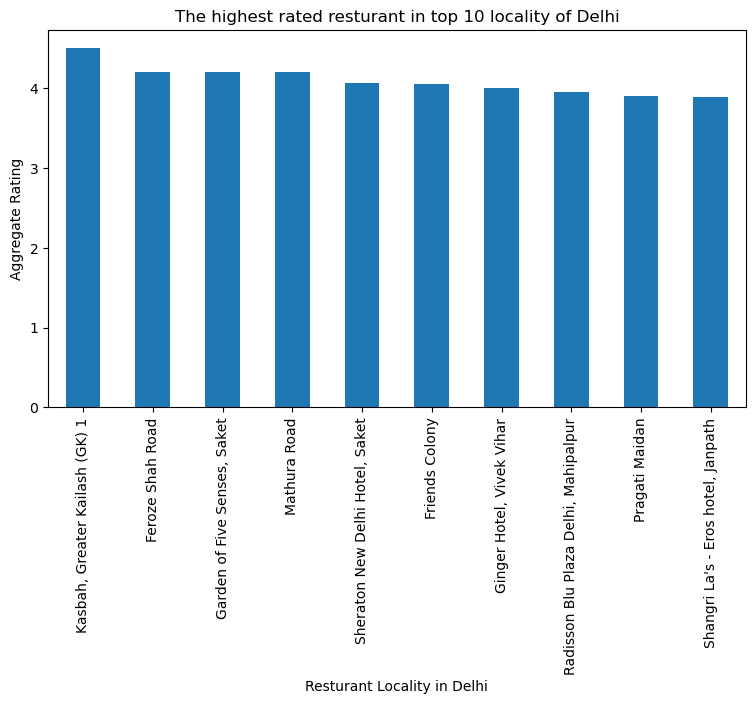

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)

x=['Locality']
y=['Aggregate rating']
# title
plt.title('The highest rated resturant in top 10 locality of Delhi')
#On x-axis

#giving a bar plot
df_Res.groupby('Locality')['Aggregate rating'].mean().nlargest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in Delhi')
#On y-axis
plt.ylabel('Aggregate Rating')
    
#displays the plot
plt.show()

Plotting highest rated restaurant in top 10 locality of Delhi

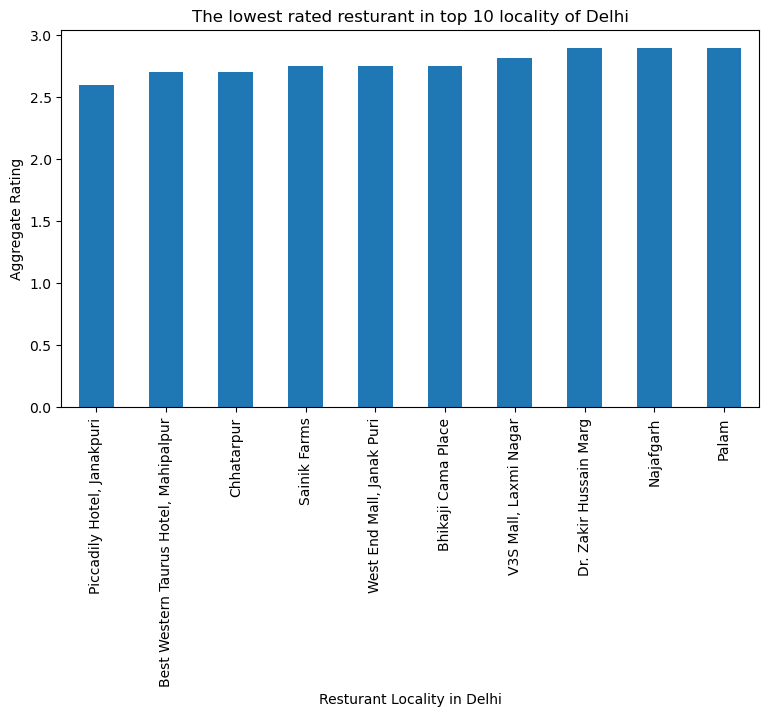

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The lowest rated resturant in top 10 locality of Delhi')
#On x-axis

#giving a bar plot
df_Res.groupby('Locality')['Aggregate rating'].mean().nsmallest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in Delhi')
#On y-axis
plt.ylabel('Aggregate Rating')
#displays the plot
plt.show()

Plotting the highest number of Restaurant available in Locality of Delhi

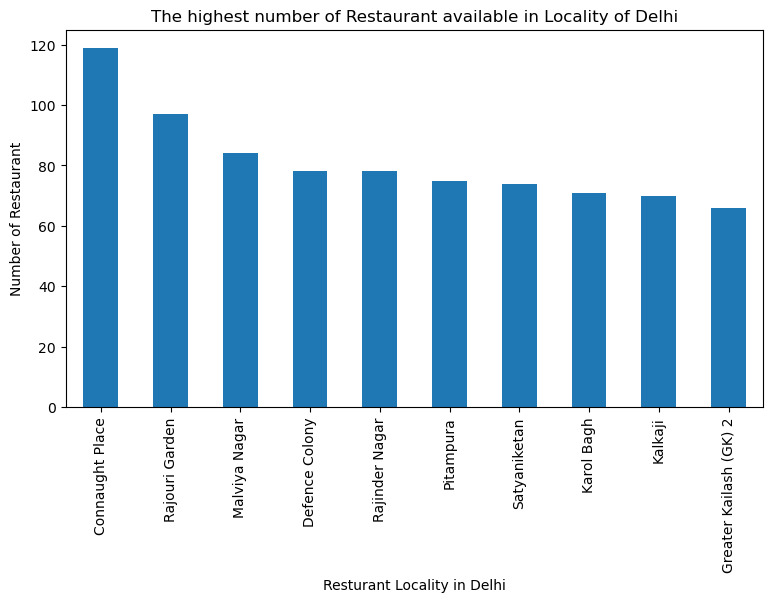

In [ ]:

import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The highest number of Restaurant available in Locality of Delhi')
#On x-axis

#giving a bar plot
df_Res.groupby('Locality')['Restaurant Name'].count().nlargest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in Delhi')
#On y-axis
plt.ylabel('Number of Restaurant')

#displays the plot
plt.show()

##### Plotting the lowest number of Restaurant available in Locality of Delhi

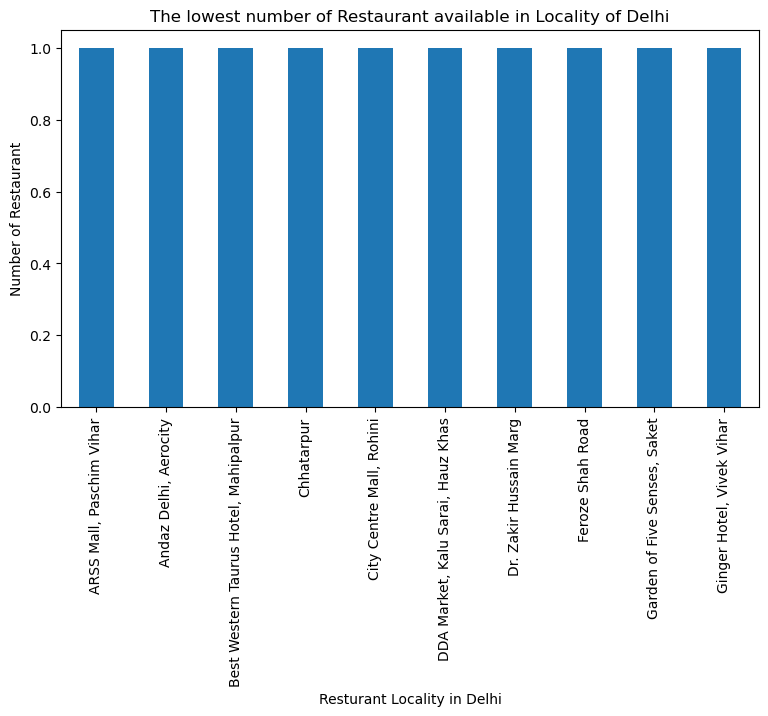

In [ ]:

import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The lowest number of Restaurant available in Locality of Delhi')
#On x-axis

#giving a bar plot
df_Res.groupby('Locality')['Restaurant Name'].count().nsmallest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in Delhi')
#On y-axis
plt.ylabel('Number of Restaurant')

#displays the plot
plt.show()

### Data Transformation

In [ ]:
df_Res_Loc =  df_Res.groupby('Locality').count()['Restaurant Name'].to_frame()
df_Res_rating= df_Res.groupby('Locality')['Aggregate rating'].mean().to_frame()
d_Cuisines = df_Res.groupby(['Locality'])['Cuisines'].agg(', '.join).reset_index()
d_R = df_Res.groupby(['Locality'])['Rating text'].unique().agg(', '.join).reset_index()
d_V = df_Res.groupby(['Locality'])['Votes'].sum().to_frame()
d_Lat = df_Res.groupby('Locality').mean()['Latitude'].to_frame()
d_Lng = df_Res.groupby('Locality').mean()['Longitude'].to_frame()
df_final = pd.merge(d_Lat,d_Lng,on='Locality').merge(df_Res_Loc, on='Locality').merge(d_Cuisines, on='Locality').merge(df_Res_rating,on ='Locality').merge(d_R, on ='Locality').merge(d_V, on ='Locality')


df_final = df_final[df_final['Aggregate rating'] != 0.000000]
df_final.columns =['Locality','Lat','Lng', 'No_of_Restaurant','Cusines', 'Agg_Rating','Comments' ,'No_of_Votes']
df_final.head()

,Locality,Lat,Lng,No_of_Restaurant,Cusines,Agg_Rating,Comments,No_of_Votes
0,"ARSS Mall, Paschim Vihar",28.668945,77.101544,1,"North Indian, South Indian, Chinese, Mithai, F...",3.100000,Average,117
1,Adchini,28.537063,77.197808,13,"Fast Food, North Indian, Seafood, Continental,...",3.292308,"Average, Good, Poor, Very Good",1560
2,"Aditya Mega Mall, Karkardooma",28.656131,77.301266,4,"Finger Food, North Indian, Mughlai, Pizza, Fas...",3.275000,"Average, Good",434
3,Aerocity,28.553077,77.104270,2,"Fast Food, Italian, Pizza, North Indian, Conti...",3.200000,Average,59
4,"Aggarwal City Mall, Pitampura",28.690020,77.134650,3,"North Indian, Chinese, Street Food, Mithai, No...",3.033333,Average,126


In [ ]:
df_final.shape

(240, 8)

Define Foursquare credentials and version

In [ ]:
CLIENT_ID = 'BPCNO0YRKLDHVQH1OWE2A2FYGZH4OPSMRIL4X5YL5RRCBGHJ' # your Foursquare ID
CLIENT_SECRET = 'EMIQF1UMPHY1D5O4XD1UGJSWPQCBTGD3SXJAWS1S43QWV3TO' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: BPCNO0YRKLDHVQH1OWE2A2FYGZH4OPSMRIL4X5YL5RRCBGHJ
CLIENT_SECRET:EMIQF1UMPHY1D5O4XD1UGJSWPQCBTGD3SXJAWS1S43QWV3TO


In [ ]:
def getNearbyVenues(names, latitudes, longitudes):
    radius=500
    LIMIT=100
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Locality', 
                  'Locality Latitude', 
                  'Locality Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

## 2. Explore Neighborhoods in Delhi

In [ ]:
# find the venues in all New Delhi Locality
new_Delhi_venues = getNearbyVenues(names=df_final['Locality'],
                                   latitudes=df_final['Lat'],
                                   longitudes=df_final['Lng']
                                  )

ARSS Mall, Paschim Vihar
Adchini
Aditya Mega Mall, Karkardooma
Aerocity
Aggarwal City Mall, Pitampura
Aggarwal City Plaza, Rohini
Alaknanda
Ambience Mall, Vasant Kunj
Anand Lok
Anand Vihar
Andaz Delhi, Aerocity
Ansal Plaza Mall, Khel Gaon Marg
Asaf Ali Road
Ashok Vihar Phase 1
Ashok Vihar Phase 2
Ashok Vihar Phase 3
Barakhamba Road
Basant Lok Market, Vasant Vihar
Bellagio, Ashok Vihar Phase 2
Best Western Taurus Hotel, Mahipalpur
Bhikaji Cama Place
Chanakyapuri
Chander Nagar
Chandni Chowk
Chawri Bazar
Chhatarpur
Chittaranjan Park
City Centre Mall, Rohini
City Square Mall, Rajouri Garden
Civil Lines
Community Centre, New Friends Colony
Connaught Place
Crescent Square Mall, Rohini
Cross River Mall, Karkardooma
Crowne Plaza Hotel, Rohini
Crowne Plaza, Mayur Vihar Phase 1
D Mall, Netaji Subhash Place
DDA Market, Kalu Sarai, Hauz Khas
DLF City Centre Mall, Shalimar Bagh
DLF Emporio Mall, Vasant Kunj
DLF Place Mall, Saket
DLF Promenade Mall, Vasant Kunj
DLF South Square, Sarojini Nagar
Darya

In [ ]:
new_Delhi_venues.head()

,Locality,Locality Latitude,Locality Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Subway,28.669999,77.102546,Sandwich Place
1,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Pizza Hut,28.670321,77.103853,Pizza Place
2,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Café Coffee Day,28.670009,77.102480,Coffee Shop
3,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Baljeet's Amritsari Koolcha,28.665768,77.100481,Indian Restaurant
4,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Little Chef,28.670000,77.101459,Chinese Restaurant


In [ ]:
new_Delhi_venues.groupby('Locality').count()

,Locality Latitude,Locality Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Locality,,,,,,
"ARSS Mall, Paschim Vihar",9,9,9,9,9,9
Adchini,6,6,6,6,6,6
"Aditya Mega Mall, Karkardooma",10,10,10,10,10,10
Aerocity,7,7,7,7,7,7
"Aggarwal City Mall, Pitampura",3,3,3,3,3,3
"Aggarwal City Plaza, Rohini",7,7,7,7,7,7
Alaknanda,4,4,4,4,4,4
"Ambience Mall, Vasant Kunj",46,46,46,46,46,46
Anand Lok,11,11,11,11,11,11


In [ ]:
print('There are {} uniques categories.'.format(len(new_Delhi_venues['Venue Category'].unique())))

There are 207 uniques categories.


## 3. Analyze Each Neighborhood

In [ ]:
# one hot encoding
new_Delhi_onehot = pd.get_dummies(new_Delhi_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
new_Delhi_onehot['Locality'] = new_Delhi_venues['Locality'] 

# move neighborhood column to the first column
fixed_columns = [new_Delhi_onehot.columns[-1]] + list(new_Delhi_onehot.columns[:-1])
new_Delhi_onehot = new_Delhi_onehot[fixed_columns]

new_Delhi_onehot.head()

,Locality,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Garage,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Basketball Court,Bed & Breakfast,Beer Garden,Bengali Restaurant,Bistro,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Bridal Shop,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Business Center,Business Service,Café,Campground,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gift Shop,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,Historic Site,History Museum,Hockey Arena,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indian Sweet Shop,Indie Movie Theater,Internet Cafe,Irani Cafe,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Karaoke Bar,Karnataka Restaurant,Korean Restaurant,Lake,Light Rail Station,Liquor Store,Lounge,Luggage Store,Market,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Mosque,Motel,Movie Theater,Moving Target,Mughlai Restaurant,Multicuisine Indian Restaurant,Multiplex,Museum,Music Store,Music Venue,National Park,Neighborhood,Nightclub,Nightlife Spot,North Indian Restaurant,Northeast Indian Restaurant,Office,Other Great Outdoors,Other Nightlife,Paper / Office Supplies Store,Park,Parsi Restaurant,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Pool,Portuguese Restaurant,Pub,Punjabi Restaurant,Racetrack,Record Shop,Rental Car Location,Restaurant,Road,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South Indian Restaurant,Spa,Sporting Goods Shop,Sports Bar,Stadium,Steakhouse,Sushi Restaurant,Tapas Restaurant,Tea Room,Temple,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park,Tibetan Restaurant,Toy / Game Store,Trail,Train Station,Turkish Restaurant,Udupi Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store
0,"ARSS Mall, Paschim Vihar",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,"ARSS Mall, Paschim Vihar",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,"ARSS Mall, Paschim Vihar",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [ ]:
new_Delhi_onehot.shape

(3192, 208)

#### Next, we will group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [ ]:
new_Delhi_grouped = new_Delhi_onehot.groupby('Locality').mean().reset_index()
new_Delhi_grouped

,Locality,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Garage,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Basketball Court,Bed & Breakfast,Beer Garden,Bengali Restaurant,Bistro,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Bridal Shop,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Business Center,Business Service,Café,Campground,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gift Shop,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,Historic Site,History Museum,Hockey Arena,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indian Sweet Shop,Indie Movie Theater,Internet Cafe,Irani Cafe,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Karaoke Bar,Karnataka Restaurant,Korean Restaurant,Lake,Light Rail Station,Liquor Store,Lounge,Luggage Store,Market,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Mosque,Motel,Movie Theater,Moving Target,Mughlai Restaurant,Multicuisine Indian Restaurant,Multiplex,Museum,Music Store,Music Venue,National Park,Neighborhood,Nightclub,Nightlife Spot,North Indian Restaurant,Northeast Indian Restaurant,Office,Other Great Outdoors,Other Nightlife,Paper / Office Supplies Store,Park,Parsi Restaurant,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Playground,Plaza,Pool,Portuguese Restaurant,Pub,Punjabi Restaurant,Racetrack,Record Shop,Rental Car Location,Restaurant,Road,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South Indian Restaurant,Spa,Sporting Goods Shop,Sports Bar,Stadium,Steakhouse,Sushi Restaurant,Tapas Restaurant,Tea Room,Temple,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park,Tibetan Restaurant,Toy / Game Store,Trail,Train Station,Turkish Restaurant,Udupi Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wings Joint,Women's Store
0,"ARSS Mall, Paschim Vihar",0.111111,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.111111,0.00,0.000000,0.000000,0.111111,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.0,0.000000,0.000,0.222222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

#### new size

In [ ]:
new_Delhi_grouped.shape

(239, 208)

In [ ]:
## print each Locality along with the top 5 most common venues

num_top_venues = 5

for hood in new_Delhi_grouped['Locality']:
    print("----"+hood+"----")
    temp = new_Delhi_grouped[new_Delhi_grouped['Locality'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ARSS Mall, Paschim Vihar----
                            venue  freq
0               Indian Restaurant  0.22
1                             ATM  0.11
2                     Coffee Shop  0.11
3  Multicuisine Indian Restaurant  0.11
4                  Sandwich Place  0.11


----Adchini----
               venue  freq
0  Indian Restaurant  0.33
1               Café  0.33
2                Pub  0.17
3   Parsi Restaurant  0.17
4                ATM  0.00


----Aditya Mega Mall, Karkardooma----
               venue  freq
0        Pizza Place   0.2
1      Shopping Mall   0.2
2  Indian Restaurant   0.2
3          Multiplex   0.2
4               Café   0.1


----Aerocity----
                  venue  freq
0                 Hotel  0.29
1        Airport Lounge  0.14
2           Coffee Shop  0.14
3      Airport Terminal  0.14
4  Fast Food Restaurant  0.14


----Aggarwal City Mall, Pitampura----
                     venue  freq
0              Pizza Place  0.33
1         Department Store  0.33
2      

#### Function to sort venues in descending order

In [ ]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Creating data frame to display top 10 venues for each neighborhood

In [ ]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Locality']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Locality'] = new_Delhi_grouped['Locality']

for ind in np.arange(new_Delhi_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(new_Delhi_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Locality,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"ARSS Mall, Paschim Vihar",Indian Restaurant,ATM,Market,Pizza Place,Multicuisine Indian Restaurant,Coffee Shop,Sandwich Place,Chinese Restaurant,French Restaurant,Food Truck
1,Adchini,Indian Restaurant,Café,Parsi Restaurant,Pub,Farmers Market,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
2,"Aditya Mega Mall, Karkardooma",Indian Restaurant,Shopping Mall,Pizza Place,Multiplex,Hotel,Café,Fast Food Restaurant,French Restaurant,Food Truck,Food Court
3,Aerocity,Hotel,Fast Food Restaurant,Airport Lounge,Airport Terminal,Coffee Shop,Rental Car Location,Women's Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant
4,"Aggarwal City Mall, Pitampura",Department Store,Pizza Place,Chinese Restaurant,Fast Food Restaurant,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court


## 4. Cluster Neighborhoods

In [ ]:
## Cluster Locality
## Run k-means to cluster the Locality into 5 clusters.

# set number of clusters
kclusters = 5

new_Delhi_clustering = new_Delhi_grouped.drop('Locality', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(new_Delhi_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 
kmeans.labels_.shape

(239,)

In [ ]:
# add clustering labels
New_Delhi_merged = df_final.head(239)
New_Delhi_merged['Cluster Labels'] = kmeans.labels_

# merge New_Delhi_grouped with df_Chinese to add latitude/longitude for each Locality
New_Delhi_merged = New_Delhi_merged.join(neighborhoods_venues_sorted.set_index('Locality'), on='Locality')

New_Delhi_merged.head()

<ipython-input-96-f2cba4c297e6>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_Delhi_merged['Cluster Labels'] = kmeans.labels_


,Locality,Lat,Lng,No_of_Restaurant,Cusines,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"ARSS Mall, Paschim Vihar",28.668945,77.101544,1,"North Indian, South Indian, Chinese, Mithai, F...",3.100000,Average,117,2,Indian Restaurant,ATM,Market,Pizza Place,Multicuisine Indian Restaurant,Coffee Shop,Sandwich Place,Chinese Restaurant,French Restaurant,Food Truck
1,Adchini,28.537063,77.197808,13,"Fast Food, North Indian, Seafood, Continental,...",3.292308,"Average, Good, Poor, Very Good",1560,1,Indian Restaurant,Café,Parsi Restaurant,Pub,Farmers Market,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
2,"Aditya Mega Mall, Karkardooma",28.656131,77.301266,4,"Finger Food, North Indian, Mughlai, Pizza, Fas...",3.275000,"Average, Good",434,2,Indian Restaurant,Shopping Mall,Pizza Place,Multiplex,Hotel,Café,Fast Food Restaurant,French Restaurant,Food Truck,Food Court
3,Aerocity,28.553077,77.104270,2,"Fast Food, Italian, Pizza, North Indian, Conti...",3.200000,Average,59,3,Hotel,Fast Food Restaurant,Airport Lounge,Airport Terminal,Coffee Shop,Rental Car Location,Women's Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant
4,"Aggarwal City Mall, Pitampura",28.690020,77.134650,3,"North Indian, Chinese, Street Food, Mithai, No...",3.033333,Average,126,2,Department Store,Pizza Place,Chinese Restaurant,Fast Food Restaurant,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court


In [ ]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
#colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
#rainbow = [colors.rgb2hex(i) for i in colors_array]
colors = ['red', 'green', 'blue', 'yellow','orange']

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(New_Delhi_merged['Lat'], New_Delhi_merged['Lng'], New_Delhi_merged['Locality'], New_Delhi_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color=colors[cluster],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### 5. Examine Clusters

#### Cluster 1

In [ ]:
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 0, New_Delhi_merged.columns[[1] + list(range(5, New_Delhi_merged.shape[1]))]]

,Lat,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
8,28.555599,3.800000,"Average, Very Good",2411,0,Café,Stadium,Dessert Shop,Hotel,Other Great Outdoors,Coffee Shop,Golf Course,Metro Station,Music Venue,Women's Store
9,28.659870,3.281481,"Average, Good",1309,0,Café,ATM,Convenience Store,Burger Joint,Burrito Place,Flea Market,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck
16,28.630440,3.208333,"Average, Good, Poor",1779,0,Bakery,Café,Indian Restaurant,Theater,Nightclub,Pool,Hotel,Train Station,Arcade,Art Gallery
17,28.557846,3.220000,"Average, Good, Poor",1875,0,Café,Fast Food Restaurant,Pizza Place,Restaurant,Chinese Restaurant,Coffee Shop,Middle Eastern Restaurant,Gourmet Shop,Pub,Cocktail Bar
20,28.568193,2.755556,"Average, Poor",339,0,Lounge,Asian Restaurant,Café,Restaurant,Chinese Restaurant,Bakery,Gym / Fitness Center,Market,Breakfast Spot,Italian Restaurant
21,28.589797,3.085714,"Average, Good, Poor",1617,0,Garden,Park,African Restaurant,Concert Hall,Trail,Café,Fast Food Restaurant,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant
28,28.650254,3.166667,"Average, Good",1217,0,Fast Food Restaurant,Indian Restaurant,Café,Cosmetics Shop,Gym / Fitness Center,Diner,Pizza Place,Clothing Store,Restaurant,Multiplex
30,28.561898,3.100000,"Average, Good",1514,0,Café,Indian Restaurant,Fast Food Restaurant,Nightclub,Chinese Restaurant,Lounge,Middle Eastern Restaurant,Grocery Store,Coffee Shop,Thai Restaurant
31,28.632091,3.779832,"Average, Excellent, Good, Very Good",128107,0,Indian Restaurant,Café,Chinese Restaurant,Bar,Coffee Shop,Lounge,Pub,Fast Food Restaurant,BBQ Joint,Gastropub
45,28.696802,3.296296,"Average, Excellent, Good, Poor, Very Good",19479,0,Café,Restaurant,Coffee Shop,Chinese Restaurant,Fast Food Restaurant,Italian Restaurant,Pizza Place,Light Rail Station,Fish & Chips Shop,Women's Store


#### Cluster 2

In [ ]:
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 1, New_Delhi_merged.columns[[1] + list(range(5, New_Delhi_merged.shape[1]))]]

,Lat,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,28.537063,3.292308,"Average, Good, Poor, Very Good",1560,1,Indian Restaurant,Café,Parsi Restaurant,Pub,Farmers Market,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
12,28.641698,3.050000,Average,17,1,Hostel,Indian Restaurant,Movie Theater,Hotel,Theme Park,Farmers Market,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
23,28.656414,3.358182,"Average, Good, Very Good",6668,1,Indian Restaurant,Snack Place,Dessert Shop,Market,Smoke Shop,Restaurant,Paper / Office Supplies Store,Train Station,Fried Chicken Joint,French Restaurant
42,28.576161,2.983333,"Average, Good, Poor",542,1,Indian Restaurant,Fast Food Restaurant,Dessert Shop,Restaurant,Shopping Mall,Market,Department Store,Pizza Place,Donut Shop,Fish & Chips Shop
43,28.643320,3.287500,"Average, Good, Poor, Very Good",2570,1,Indian Restaurant,Restaurant,Hotel,Hostel,Movie Theater,Asian Restaurant,Road,French Restaurant,Food Truck,Food Court
44,28.574288,3.496154,"Average, Good, Poor, Very Good",15579,1,Indian Restaurant,Italian Restaurant,Coffee Shop,Bakery,Restaurant,Burger Joint,Food Truck,South Indian Restaurant,Sandwich Place,Pub
47,28.681582,3.046875,"Average, Good, Poor",1224,1,Indian Restaurant,Afghan Restaurant,Gym,Market,Women's Store,Fish & Chips Shop,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant
49,28.602169,2.900000,Average,7,1,Indian Restaurant,Golf Course,Italian Restaurant,Convenience Store,North Indian Restaurant,Café,Snack Place,Gaming Cafe,Hotel,Falafel Restaurant
55,28.617102,4.200000,Very Good,3010,1,Indian Restaurant,Women's Store,Fast Food Restaurant,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
71,28.641003,3.650000,"Average, Good",367,1,Indian Restaurant,Hostel,Hotel,Road,Movie Theater,Soccer Stadium,Hotel Bar,Farmers Market,French Restaurant,Food Truck


#### Cluster 3

In [ ]:
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 2, New_Delhi_merged.columns[[1] + list(range(5, New_Delhi_merged.shape[1]))]]

,Lat,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,28.668945,3.100000,Average,117,2,Indian Restaurant,ATM,Market,Pizza Place,Multicuisine Indian Restaurant,Coffee Shop,Sandwich Place,Chinese Restaurant,French Restaurant,Food Truck
2,28.656131,3.275000,"Average, Good",434,2,Indian Restaurant,Shopping Mall,Pizza Place,Multiplex,Hotel,Café,Fast Food Restaurant,French Restaurant,Food Truck,Food Court
4,28.690020,3.033333,Average,126,2,Department Store,Pizza Place,Chinese Restaurant,Fast Food Restaurant,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
13,28.690182,3.090000,"Average, Good, Poor",971,2,Dessert Shop,Smoke Shop,BBQ Joint,Market,Snack Place,Pizza Place,Indian Restaurant,Diner,Fish & Chips Shop,Furniture / Home Store
14,28.693969,3.378571,"Average, Good",2343,2,Indian Restaurant,South Indian Restaurant,Pizza Place,Coffee Shop,Sandwich Place,Asian Restaurant,Fast Food Restaurant,Fried Chicken Joint,French Restaurant,Food Truck
15,28.691136,3.390909,"Average, Good, Very Good",485,2,Indian Restaurant,Pizza Place,South Indian Restaurant,Gym / Fitness Center,Farmers Market,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
18,28.696302,3.300000,"Average, Good",415,2,Indian Restaurant,South Indian Restaurant,Pizza Place,Coffee Shop,Sandwich Place,Asian Restaurant,Fast Food Restaurant,Fried Chicken Joint,French Restaurant,Food Truck
22,28.654105,3.085714,Average,80,2,Pizza Place,Gym,Gaming Cafe,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food
33,28.657388,3.320000,"Average, Good",636,2,Pizza Place,Indian Restaurant,Hotel,Farmers Market,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
57,28.699837,3.376471,"Average, Good, Very Good",2460,2,Pizza Place,Food Truck,Department Store,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Court,Food & Drink Shop,Food


#### Cluster 4

In [ ]:
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 3, New_Delhi_merged.columns[[1] + list(range(5, New_Delhi_merged.shape[1]))]]

,Lat,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,28.553077,3.200000,Average,59,3,Hotel,Fast Food Restaurant,Airport Lounge,Airport Terminal,Coffee Shop,Rental Car Location,Women's Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant
10,28.554807,3.000000,Average,4,3,Hotel,Coffee Shop,Restaurant,Indian Restaurant,Shopping Mall,Food Court,Multicuisine Indian Restaurant,Spa,Bed & Breakfast,Bakery
19,28.548827,2.700000,Average,9,3,Hotel,Indian Restaurant,Accessories Store,Italian Restaurant,Shoe Store,Hotel Bar,Bed & Breakfast,Fish & Chips Shop,Frozen Yogurt Shop,Fried Chicken Joint
35,28.590297,3.350000,"Average, Good",127,3,Hotel,Indian Restaurant,Liquor Store,Asian Restaurant,American Restaurant,Arcade,Pizza Place,Restaurant,Food Truck,French Restaurant
56,28.570246,4.050000,"Average, Excellent",1949,3,Hotel,Sculpture Garden,Gym,Café,Women's Store,Fast Food Restaurant,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
60,28.665829,4.000000,Very Good,756,3,Hotel,Indian Restaurant,Café,Asian Restaurant,BBQ Joint,Women's Store,Fish & Chips Shop,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant
69,28.550327,3.300000,Average,30,3,Hotel,Bed & Breakfast,Hotel Bar,Coffee Shop,Restaurant,Japanese Restaurant,Spa,Bakery,Lounge,Shopping Mall
70,28.590654,3.550000,"Average, Good",302,3,Hotel,Restaurant,Light Rail Station,American Restaurant,Market,Liquor Store,Asian Restaurant,Arcade,Bakery,Pizza Place
74,28.621267,3.416667,"Average, Good",475,3,Hotel,Indian Restaurant,Italian Restaurant,Restaurant,Internet Cafe,Coffee Shop,Bar,Chinese Restaurant,Lounge,Metro Station
83,28.552895,3.300000,Average,15,3,Hotel,Restaurant,Coffee Shop,Hotel Bar,Punjabi Restaurant,Japanese Restaurant,Lounge,Shopping Mall,Spa,Train Station


#### Cluster 5

In [ ]:
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 4, New_Delhi_merged.columns[[1] + list(range(5, New_Delhi_merged.shape[1]))]]

,Lat,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,28.700516,3.040000,"Average, Good, Poor",594,4,Gym / Fitness Center,Shopping Mall,Pizza Place,Sandwich Place,Multiplex,Salad Place,Fast Food Restaurant,Farmers Market,Food Truck,Food Court
6,28.527088,3.117391,"Average, Good, Poor",1012,4,Coffee Shop,Steakhouse,Food & Drink Shop,Market,Women's Store,Fast Food Restaurant,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck
7,28.541298,3.425000,"Average, Good, Very Good",2460,4,Coffee Shop,Fast Food Restaurant,Shopping Mall,Café,Clothing Store,Asian Restaurant,Italian Restaurant,Chinese Restaurant,Indian Restaurant,Movie Theater
11,28.562580,3.750000,"Average, Good, Very Good",875,4,Fast Food Restaurant,Shopping Mall,Japanese Restaurant,Comfort Food Restaurant,Electronics Store,Women's Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck
24,28.649658,3.800000,"Average, Excellent, Good, Very Good",1410,4,Indian Restaurant,Light Rail Station,Fast Food Restaurant,Hardware Store,Snack Place,Mosque,Paper / Office Supplies Store,Donut Shop,Fish & Chips Shop,Frozen Yogurt Shop
25,28.495624,2.700000,Average,23,4,Indian Restaurant,Donut Shop,Japanese Restaurant,Hotel,Light Rail Station,Luggage Store,Fish & Chips Shop,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint
26,28.538688,3.130303,"Average, Good, Poor",2578,4,Market,Beer Garden,Park,Women's Store,Fish & Chips Shop,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck
27,28.716874,3.400000,Average,134,4,Department Store,Shopping Mall,Indian Restaurant,Light Rail Station,Gym,Café,Fast Food Restaurant,Eastern European Restaurant,Flea Market,Dim Sum Restaurant
29,28.681233,3.300000,"Average, Good, Very Good",769,4,Chinese Restaurant,Coffee Shop,Burger Joint,Light Rail Station,Smoke Shop,Dumpling Restaurant,Eastern European Restaurant,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant
32,28.718351,3.150000,"Average, Good",494,4,Pharmacy,Clothing Store,Food Court,Athletics & Sports,Chinese Restaurant,Restaurant,Dumpling Restaurant,Fast Food Restaurant,Fried Chicken Joint,French Restaurant
